<a href="https://colab.research.google.com/github/Parul1606/Fake-NewsDetection/blob/main/Fake_News_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Fake News Detector**

In [1]:
import locale
print(locale.getpreferredencoding())

UTF-8


In [2]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re #rejects
from wordcloud import WordCloud #wordcloud is text visualization python package(visualizes total no of words and how the words are actually distributed in the text data)

In [4]:
from tensorflow.keras.preprocessing.text import Tokenizer                       #ex- "never give up" tokenization will brake the sentences into token i.e. from this ex results in 3 tokens - never-give-up.
from tensorflow.keras.preprocessing.sequence import pad_sequences               #it is used to pad those texts which are not long enough..ex-if we;ve declared a const int this proj of 700..and our news dataset is of 200 texts then it will add relevant texts to it.
from tensorflow.keras.models import Sequential                                  #feeding model layers inside the sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D   #embedding-converts each word into a fixed-length vector of defined size, dense-the regular deeply connected neural network layer, lstm-This layer uses available constraints and runtime hardware to gain the most optimized performance, conv1d- This layer creates a convolution kernel that is convolved with the layer input over a single spatial (or temporal) dimension to produce a tensor of outputs. If use_bias is True, a bias vector is created and added to the outputs, maxpool1d - reduces the dimensionality of images by reducing the number of pixels in the output from the previous convolutional layer.
from sklearn.model_selection import train_test_split                            #Train-test-split is a technique used in Python Machine Learning (MPL) to split a dataset into training data and test data
from sklearn.metrics import classification_report, accuracy_score               #used to test model performance (accuracy)

**Exploring Fake News**

In [5]:
fake = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/Fake.csv')

In [6]:
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [7]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [8]:
fake['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

<Axes: xlabel='subject', ylabel='count'>

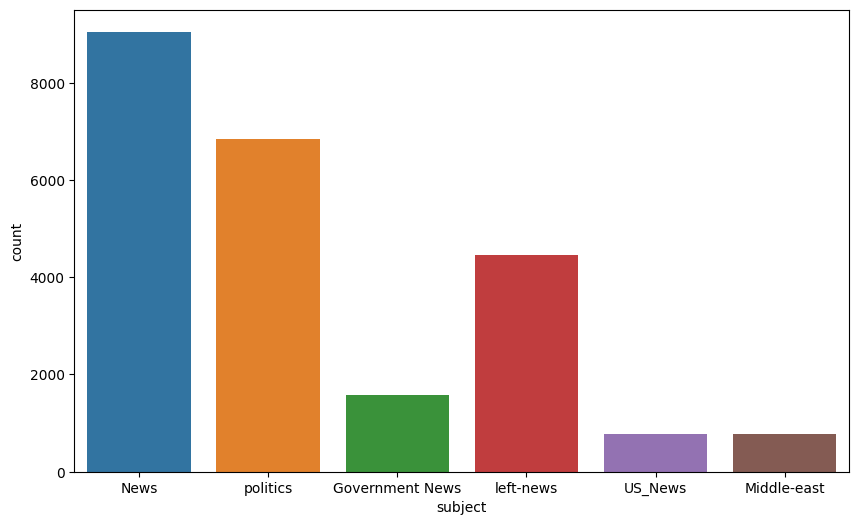

In [9]:
#visualization using grapgh
plt.figure(figsize=(10,6))
sns.countplot(x='subject',data=fake)

**WordCloud(Fake News)**

For text data visualization we are using wordcloud

In [10]:
fake['text'].tolist()

['Donald Trump just couldn t wish all Americans a Happy New Year and leave it at that. Instead, he had to give a shout out to his enemies, haters and  the very dishonest fake news media.  The former reality show star had just one job to do and he couldn t do it. As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year,  President Angry Pants tweeted.  2018 will be a great year for America! As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year. 2018 will be a great year for America!  Donald J. Trump (@realDonaldTrump) December 31, 2017Trump s tweet went down about as welll as you d expect.What kind of president sends a New Year s greeting like this despicable, petty, infantile gibberish? Only Trump! His lack of decency won t e

In [11]:
text = ' '.join(fake['text'].tolist())

In [12]:
#example of how above cell works
' '.join(['this', 'is', 'a', 'data'])

'this is a data'

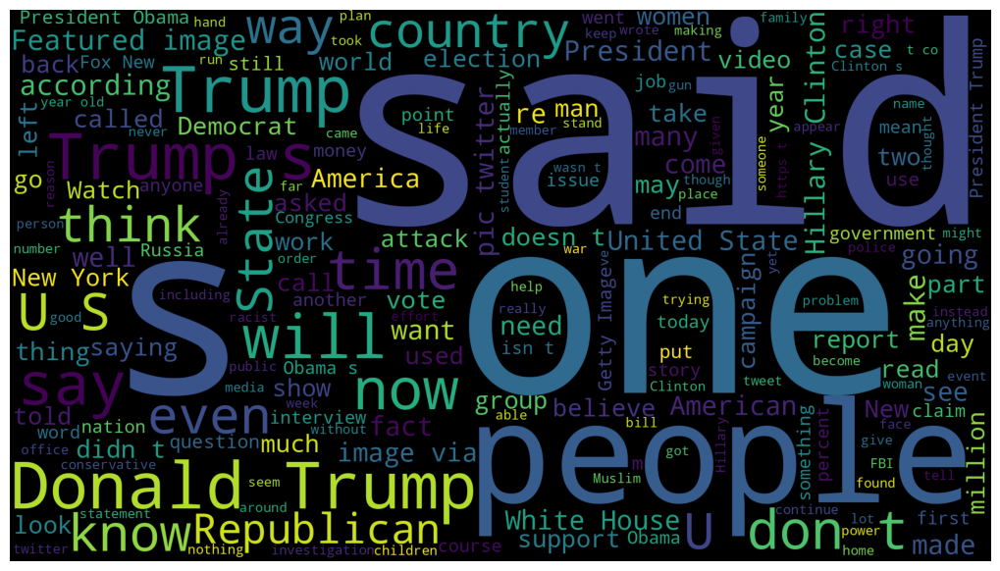

In [13]:
wordcloud = WordCloud(width=1920, height=1080).generate(text)
fig = plt.figure(figsize=(10, 10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

**Exploring Real News**

In [14]:
real = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/True.csv')

In [15]:
real.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [16]:
real.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [17]:
real['subject'].value_counts()

politicsNews    11272
worldnews       10145
Name: subject, dtype: int64

<Axes: xlabel='subject', ylabel='count'>

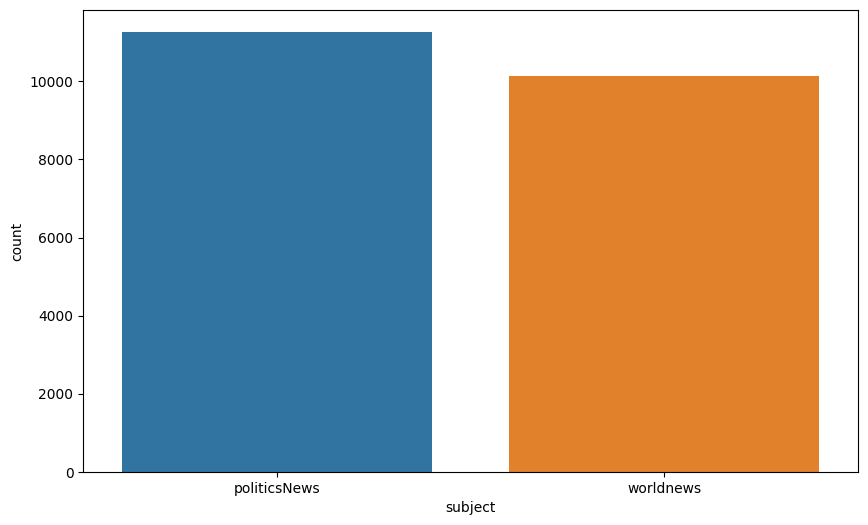

In [18]:
#visualization using grapgh
plt.figure(figsize=(10,6))
sns.countplot(x='subject',data=real)

In [19]:
real['text'].tolist()

['WASHINGTON (Reuters) - The head of a conservative Republican faction in the U.S. Congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on Sunday and urged budget restraint in 2018. In keeping with a sharp pivot under way among Republicans, U.S. Representative Mark Meadows, speaking on CBS’ “Face the Nation,” drew a hard line on federal spending, which lawmakers are bracing to do battle over in January. When they return from the holidays on Wednesday, lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues, such as immigration policy, even as the November congressional election campaigns approach in which Republicans will seek to keep control of Congress. President Donald Trump and his Republicans want a big budget increase in military spending, while Democrats also want proportional increases for non-defense “discretionary” spending on programs that support educa

In [20]:
text = ' '.join(real['text'].tolist())

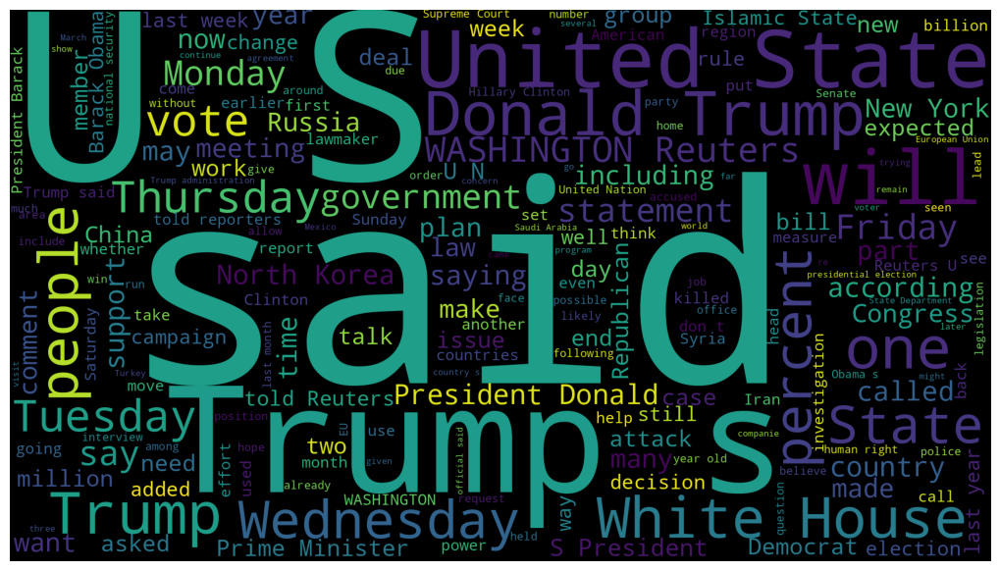

In [21]:
wordcloud = WordCloud(width=1920, height=1080).generate(text)
fig = plt.figure(figsize=(10, 10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

**Cleaning Data**

In [22]:
real.sample(5)

,title,text,subject,date
18351,State workers protest in Romania over social s...,BUCHAREST (Reuters) - Thousands of state worke...,worldnews,"October 4, 2017"
17273,Italy's Berlusconi says center-right agrees pa...,ROME (Reuters) - Former Prime Minister Silvio ...,worldnews,"October 17, 2017"
1347,California governor signs drug pricing transpa...,(Reuters) - California Governor Jerry Brown on...,politicsNews,"October 9, 2017"
18395,Greece overcomes forestry setback to develop A...,ATHENS (Reuters) - Greece has won an appeal ov...,worldnews,"October 3, 2017"
1466,"U.S. will admit up to 45,000 refugees next yea...",WASHINGTON (Reuters) - The United States will ...,politicsNews,"September 29, 2017"


creating a list of indexes which do not have publications information or that contain publisher names that are either too long or improperly formatted.

In [23]:
unknown_publishers = []
for index, row in enumerate(real.text.values):
  try:
    record = row.split('-', maxsplit=1)
    record[1]
    assert(len(record[0])<120)
  except:
    unknown_publishers.append(index)

In [24]:
len(unknown_publishers)

222

In [25]:
real.iloc[unknown_publishers].text  #getting text data of unknown pulishers

7        The following statements were posted to the ve...
8        The following statements were posted to the ve...
12       The following statements were posted to the ve...
13       The following statements were posted to the ve...
14        (In Dec. 25 story, in second paragraph, corre...
                               ...                        
20135     (Story corrects to million from billion in pa...
20500     (This Sept 8 story corrects headline, clarifi...
20667     (Story refiles to add dropped word  not , in ...
21246     (Story corrects third paragraph to show Mosul...
21339     (Story corrects to fix spelling in paragraph ...
Name: text, Length: 222, dtype: object

In [26]:
real.iloc[8970]

title      Graphic: Supreme Court roundup
text                                     
subject                      politicsNews
date                       June 16, 2016 
Name: 8970, dtype: object

In [27]:
real = real.drop(8970, axis=0)

In [28]:
publisher = []
tmp_text = []

for index, row in enumerate(real.text.values):
  if index in unknown_publishers:
    tmp_text.append(row)
    publisher.append('unknown')

  else:
    record = row.split('-', maxsplit=1)
    publisher.append(record[0].strip())
    tmp_text.append(record[1].strip())

#The purpose of this code appears to be to extract the publisher names and main text from the rows in real.text.values, using the unknown_publishers list to handle cases where the publisher name is improperly formatted or missing. The final publisher and tmp_text lists should contain the publisher names and main text from each row in real.text.values, respectively.

In [29]:
real['publisher'] = publisher
real['text'] = tmp_text

In [30]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [31]:
real.shape

(21416, 5)

In [32]:
[index for index,text in enumerate(fake.text.tolist()) if str(text).strip()==""]

[10923,
 11041,
 11190,
 11225,
 11236,
 11241,
 11247,
 11249,
 11267,
 11268,
 11283,
 11284,
 11285,
 11289,
 11290,
 11292,
 11295,
 11296,
 11301,
 11303,
 11304,
 11305,
 11309,
 11314,
 11317,
 11319,
 11322,
 11330,
 11334,
 11335,
 11340,
 11343,
 11348,
 11351,
 11352,
 11357,
 11371,
 11373,
 11374,
 11382,
 11397,
 11402,
 11403,
 11409,
 11410,
 11412,
 11415,
 11419,
 11421,
 11427,
 11431,
 11432,
 11440,
 11448,
 11450,
 11453,
 11462,
 11464,
 11465,
 11472,
 11473,
 11475,
 11478,
 11489,
 11491,
 11493,
 11494,
 11501,
 11505,
 11507,
 11520,
 11531,
 11532,
 11533,
 11538,
 11542,
 11547,
 11549,
 11551,
 11559,
 11563,
 11581,
 11585,
 11589,
 11590,
 11614,
 11624,
 11625,
 11627,
 11631,
 11636,
 11637,
 11643,
 11650,
 11658,
 11661,
 11672,
 11679,
 11681,
 11684,
 11686,
 11688,
 11692,
 11708,
 11718,
 11729,
 11739,
 11753,
 11765,
 11768,
 11777,
 11782,
 11786,
 11788,
 11792,
 11793,
 11803,
 11806,
 11813,
 11821,
 11831,
 11832,
 11841,
 11844,
 11848,


In [33]:
empty_fake_index = [index for index,text in enumerate(fake.text.tolist()) if str(text).strip()==""]
# each item is converted to a string using str(text), and then leading and trailing whitespace is removed using the strip() method. The strip() method is called before checking if the resulting string is empty, because strip() will convert a string containing only whitespace characters to an empty string.
#The enumerate() function is used to get both the index and value of each item in fake.text during the iteration. If the stripped string is empty, then the index of the item is added to the empty_fake_index list.
# the purpose of this code is to find the indices of any empty or whitespace-only items in the fake.text column. The resulting list empty_fake_index should contain these indices.

In [34]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [35]:
real['text'] = real['title'] + " " + real['text']
fake['text'] = fake['title'] + " " + fake['text']

In [36]:
real['text'] = real['text'].apply(lambda x: str(x).lower())
fake['text'] = fake['text'].apply(lambda x: str(x).lower())

**Preprocessing Text**
* The technique of preparing (cleaning and organizing) the raw data to make it suitable for a building and training Machine Learning models.
* remove special characters(@,.) for this we are going to use kgptakie process
* Data cleaning, transformation, normalization, selection, reduction are the series of steps involved in preprocessing the data



In [37]:
real['class'] = 1
fake['class'] = 0

In [38]:
real.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [39]:
real = real[['text', 'class']]

In [40]:
fake = fake[['text', 'class']]

In [41]:
real.append(fake, ignore_index=True)

<ipython-input-41-2c6d41c2f096>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  real.append(fake, ignore_index=True)


,text,class
0,"as u.s. budget fight looms, republicans flip t...",1
1,u.s. military to accept transgender recruits o...,1
2,senior u.s. republican senator: 'let mr. muell...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge 'much mor...,1
...,...,...
44892,mcpain: john mccain furious that iran treated ...,0
44893,justice? yahoo settles e-mail privacy class-ac...,0
44894,sunnistan: us and allied ‘safe zone’ plan to t...,0
44895,how to blow $700 million: al jazeera america f...,0


In [42]:
data = real.append(fake, ignore_index=True)

<ipython-input-42-45d5ced910ac>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = real.append(fake, ignore_index=True)


In [43]:
data.sample(5)

,text,class
10796,obama plans to sign north korea sanctions bill...,1
14689,eu parliament's brexit negotiator - 'not so pe...,1
28653,trump’s excuse for all his sexist statements ...,0
40919,what the heck! why was al gore meeting with th...,0
43688,redux 1963? the deep state vs donald trump pat...,0


now in the next step of preprocessing we are going to remove special charaters(, . @ etc)

In [44]:
# https://github.com/laxmimerit/preprocess_kgptalkie

Installing dependencies

In [45]:
!pip install spacy==3.5.1
!python -m spacy download en_core_web_sm
!pip install beautifulsoup4==4.12.0
!pip install textblob==0.17.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 70.2 MB/s eta 0:00:00
  Attempting uninstall: typer
    Found existing installation: typer 0.9.0
    Uninstalling typer-0.9.0:
      Successfully uninstalled typer-0.9.0
  Attempting uninstall: spacy
    Found existing installation: spacy 3.5.4
    Uninstalling spacy-3.5.4:
      Successfully uninstalled spacy-3.5.4
2023-07-11 18:13:06.486056: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 72.2 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.2/132.2 kB 14.7 MB/s eta 0:00:00
  Attempting uninstall: beautifulsoup4
    Found existing installation: beautifulsoup4 4.11.2
    Uninstalling beautifulsoup4-4.11.2:
      Successfully uninstalled beautifulsoup4-4.11.2


In [46]:
!pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall

  Cloning https://github.com/laxmimerit/preprocess_kgptalkie.git to /tmp/pip-req-build-kzr7v6eo
  Running command git clone --filter=blob:none --quiet https://github.com/laxmimerit/preprocess_kgptalkie.git /tmp/pip-req-build-kzr7v6eo
  Resolved https://github.com/laxmimerit/preprocess_kgptalkie.git to commit 9ca68d37027af9f6a30d54640347ce3b2e2694b3
  Preparing metadata (setup.py) ... done
  Created wheel for preprocess-kgptalkie: filename=preprocess_kgptalkie-0.1.3-py3-none-any.whl size=7620 sha256=57ede5cd54b24d74387af265ba1c72d1c9236fdb3e403333d111c7d5b1e2a473
  Stored in directory: /tmp/pip-ephem-wheel-cache-9mgvuar4/wheels/5c/94/34/99d5ff65e88b8d9a6c5e8d8652f2311d87790a61a1b7466e21
Successfully built preprocess-kgptalkie


In [47]:
import preprocess_kgptalkie as ps

In [48]:
data['text'].apply(lambda x: ps.remove_special_chars(x))

0        as us budget fight looms republicans flip thei...
1        us military to accept transgender recruits on ...
2        senior us republican senator let mr mueller do...
3        fbi russia probe helped by australian diplomat...
4        trump wants postal service to charge much more...
                               ...                        
44892    mcpain john mccain furious that iran treated u...
44893    justice yahoo settles email privacy classactio...
44894    sunnistan us and allied safe zone plan to take...
44895    how to blow 700 million al jazeera america fin...
44896    10 us navy sailors held by iranian military si...
Name: text, Length: 44897, dtype: object

In [49]:
data['text'] = data['text'].apply(lambda x: ps.remove_special_chars(x))

In [50]:
ps.remove_special_chars('this ,. @ # is gre@t')

'this is gret'

In [51]:
data.head()

,text,class
0,as us budget fight looms republicans flip thei...,1
1,us military to accept transgender recruits on ...,1
2,senior us republican senator let mr mueller do...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge much more...,1


**Vectorization - Word2Vec**
Word2Vec is one of the most popular technique to learn word embedding using shallow neural network.
Word embedding is the most popular presentation of document vocabulary. It is capable of capturing context of a word in a document semantic and synctactic similarity, relation with other words, etc.
the above data will now be converted into numerical data using word2vec or vectorization
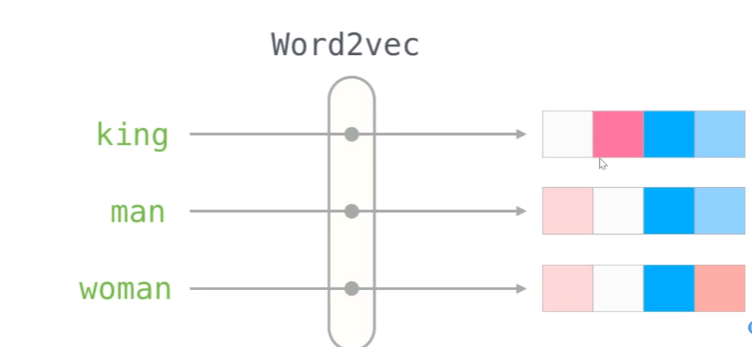

In [52]:
import gensim  #Gensim includes tools for creating and working with word embeddings, such as Word2Vec and GloVe, which represent words as dense vectors in a high-dimensional space.

In [53]:
y = data['class'].values

In [54]:
X = [d.split() for d in data['text'].tolist()]

In [55]:
type(X[0])

list

In [56]:
print(X[0])

['as', 'us', 'budget', 'fight', 'looms', 'republicans', 'flip', 'their', 'fiscal', 'script', 'the', 'head', 'of', 'a', 'conservative', 'republican', 'faction', 'in', 'the', 'us', 'congress', 'who', 'voted', 'this', 'month', 'for', 'a', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts', 'called', 'himself', 'a', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', '2018', 'in', 'keeping', 'with', 'a', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'us', 'representative', 'mark', 'meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'a', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'a', 'federal', 'budget', 'in', 'a', 'fight', 'likely', 'to', 'be', 'linked', 'to', 'other', 'issues',

In [57]:
DIM = 100 #each of this word will be converted into sequences of 100 vectors
w2v_model = gensim.models.Word2Vec(sentences=X, vector_size=DIM, window=10, min_count=1)

In [58]:
len(w2v_model.wv)

231872

In [59]:
w2v_model.wv['india']

array([-2.320896  , -0.25920185, -1.6732924 , -0.1657275 ,  0.02448281,
       -2.5842519 ,  1.4473314 ,  0.5606231 , -1.4291708 ,  1.7330334 ,
        1.3257798 ,  1.3253213 , -2.229324  , -2.251326  ,  0.9897367 ,
        3.079532  ,  1.1905396 ,  0.8476971 , -1.119479  , -2.1103485 ,
        3.2826316 ,  1.3306991 ,  1.8024303 , -1.6488532 ,  1.1328334 ,
        1.035684  , -0.4059124 , -0.71189207, -1.0987453 , -0.15052813,
        2.3202074 , -1.0495902 , -2.2270067 ,  0.9290908 , -0.7515172 ,
        2.2740653 , -0.4002397 ,  0.40993387,  2.6126142 ,  0.7713025 ,
        2.2103126 , -4.3754907 ,  2.411511  ,  1.8106115 , -1.2808139 ,
       -0.1189724 , -0.66416436,  1.5230423 , -0.58001924, -0.48767897,
       -1.8304005 ,  0.17401728,  1.6110618 , -0.48265368,  0.5881969 ,
       -1.4159193 , -1.3141881 ,  0.2264763 ,  0.13620602, -2.7533607 ,
        0.6831753 ,  1.0941222 , -0.93439096,  0.9761861 ,  0.46173963,
        1.4157972 , -2.5696213 , -0.3015228 ,  1.3806508 ,  0.55

In [60]:
w2v_model.wv.most_similar('india')

[('pakistan', 0.7497084140777588),
 ('malaysia', 0.6836634278297424),
 ('australia', 0.6335782408714294),
 ('china', 0.6275448799133301),
 ('indian', 0.6142684817314148),
 ('indonesia', 0.6103333234786987),
 ('thailand', 0.606480598449707),
 ('norway', 0.5953230261802673),
 ('asia', 0.5930973291397095),
 ('senegal', 0.5911325812339783)]

**Tokenization**

*   Tokenization is the process of replacing sensitive data with unique identification symbols.
*  such as a credit card number, is replaced by a surrogate value known as a token

In [61]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)

In [62]:
X = tokenizer.texts_to_sequences(X)

In [63]:
tokenizer.word_index

{'the': 1,
 'to': 2,
 'of': 3,
 'a': 4,
 'and': 5,
 'in': 6,
 'that': 7,
 'on': 8,
 'for': 9,
 's': 10,
 'is': 11,
 'he': 12,
 'said': 13,
 'trump': 14,
 'it': 15,
 'with': 16,
 'was': 17,
 'as': 18,
 'his': 19,
 'by': 20,
 'has': 21,
 'be': 22,
 'have': 23,
 'not': 24,
 'from': 25,
 'this': 26,
 'at': 27,
 'are': 28,
 'who': 29,
 'us': 30,
 'an': 31,
 'they': 32,
 'i': 33,
 'but': 34,
 'we': 35,
 'would': 36,
 'president': 37,
 'about': 38,
 'will': 39,
 'their': 40,
 'had': 41,
 'you': 42,
 't': 43,
 'been': 44,
 'were': 45,
 'people': 46,
 'more': 47,
 'or': 48,
 'after': 49,
 'which': 50,
 'she': 51,
 'her': 52,
 'one': 53,
 'if': 54,
 'its': 55,
 'out': 56,
 'all': 57,
 'what': 58,
 'state': 59,
 'when': 60,
 'new': 61,
 'also': 62,
 'up': 63,
 'there': 64,
 'over': 65,
 'no': 66,
 'house': 67,
 'donald': 68,
 'our': 69,
 'states': 70,
 'clinton': 71,
 'obama': 72,
 'government': 73,
 'can': 74,
 'just': 75,
 'him': 76,
 'so': 77,
 'than': 78,
 'republican': 79,
 'other': 80,
 'so

In [64]:
X

[[18,
  30,
  473,
  480,
  10668,
  133,
  8088,
  40,
  1375,
  5171,
  1,
  419,
  3,
  4,
  301,
  79,
  6312,
  6,
  1,
  30,
  189,
  29,
  773,
  26,
  279,
  9,
  4,
  1107,
  2956,
  3,
  1,
  124,
  954,
  2,
  447,
  9,
  184,
  1193,
  173,
  393,
  4,
  1375,
  301,
  8,
  342,
  5,
  1110,
  473,
  7805,
  6,
  1188,
  6,
  1764,
  16,
  4,
  3407,
  7895,
  141,
  164,
  320,
  133,
  30,
  798,
  922,
  7806,
  675,
  8,
  2010,
  476,
  1,
  383,
  1761,
  4,
  559,
  589,
  8,
  168,
  691,
  50,
  408,
  28,
  17340,
  2,
  89,
  1352,
  65,
  6,
  410,
  60,
  32,
  776,
  25,
  1,
  8089,
  8,
  203,
  408,
  39,
  1438,
  350,
  2,
  929,
  4,
  168,
  473,
  6,
  4,
  480,
  304,
  2,
  22,
  1957,
  2,
  80,
  426,
  170,
  18,
  312,
  208,
  107,
  18,
  1,
  515,
  570,
  96,
  1781,
  1504,
  6,
  50,
  133,
  39,
  1072,
  2,
  377,
  349,
  3,
  189,
  37,
  68,
  14,
  5,
  19,
  133,
  182,
  4,
  379,
  473,
  959,
  6,
  169,
  691,
  110,
  196,
  62,

Analyzing the text data

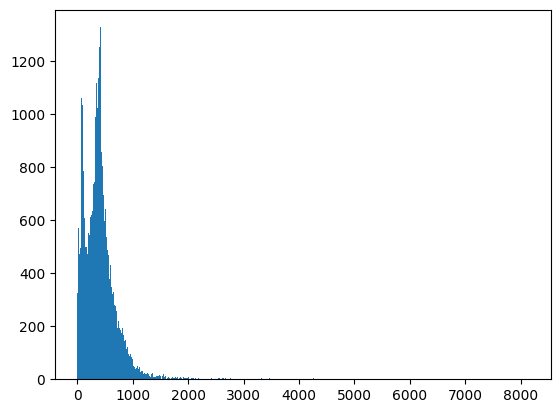

In [65]:
plt.hist([len(x) for x in (X)], bins = 700)
plt.show()

In [66]:
nos = np.array([len(x) for x in X])
len(nos[nos>1000])   #checking no of news having more than 1000 words

1581

In [67]:
maxlen = 1000
X = pad_sequences(X, maxlen=maxlen)  #this functn transforms a list of sequences into a 2d numpy array of shape

In [68]:
len(X[101])

1000

In [69]:
vocab_size = len(tokenizer.word_index) + 1
vocab = tokenizer.word_index

In [70]:
def get_weight_matrix(model):
  weight_matrix = np.zeros((vocab_size, DIM))

  for word, i in vocab.items():
    weight_matrix[i] = model.wv[word]

  return weight_matrix


In [71]:
embedding_vectors = get_weight_matrix(w2v_model)

In [72]:
embedding_vectors.shape

(231873, 100)

In [73]:
model = Sequential()
model.add(Embedding(vocab_size, output_dim=DIM, weights = [embedding_vectors], input_length=maxlen, trainable=False))
model.add(LSTM(units=128))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

In [74]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 1000, 100)         23187300  
                                                                 
 lstm (LSTM)                 (None, 128)               117248    
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 23,304,677
Trainable params: 117,377
Non-trainable params: 23,187,300
_________________________________________________________________


**Train and Test the model**

In [75]:
X_train, X_test, y_train, y_test = train_test_split(X,y)

In [76]:
model.fit(X_train, y_train, validation_split = 0.3, epochs=6)  #training the dataset

Epoch 1/6
737/737 [==============================] - 36s 38ms/step - loss: 0.1363 - acc: 0.9513 - val_loss: 0.0698 - val_acc: 0.9794
Epoch 2/6
737/737 [==============================] - 27s 37ms/step - loss: 0.0562 - acc: 0.9816 - val_loss: 0.0692 - val_acc: 0.9774
Epoch 3/6
737/737 [==============================] - 27s 37ms/step - loss: 0.0316 - acc: 0.9891 - val_loss: 0.0285 - val_acc: 0.9909
Epoch 4/6
737/737 [==============================] - 27s 37ms/step - loss: 0.0159 - acc: 0.9944 - val_loss: 0.0345 - val_acc: 0.9892
Epoch 5/6
737/737 [==============================] - 27s 37ms/step - loss: 0.0180 - acc: 0.9942 - val_loss: 0.0229 - val_acc: 0.9927
Epoch 6/6
737/737 [==============================] - 28s 38ms/step - loss: 0.0070 - acc: 0.9980 - val_loss: 0.0190 - val_acc: 0.9932


In [77]:
model.predict(X_test) >= 0.5   #it's giving the probability

351/351 [==============================] - 5s 13ms/step


array([[ True],
       [ True],
       [ True],
       ...,
       [False],
       [ True],
       [ True]])

In [78]:
y_pred = (model.predict(X_test) >=0.5).astype(int)

351/351 [==============================] - 4s 13ms/step


In [79]:
accuracy_score(y_test, y_pred)

0.9952783964365256

In [80]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      5955
           1       0.99      1.00      0.99      5270

    accuracy                           1.00     11225
   macro avg       1.00      1.00      1.00     11225
weighted avg       1.00      1.00      1.00     11225



In [81]:
x = ['this is a news']

In [82]:
X_test

array([[    0,     0,     0, ...,     1,   248,   403],
       [    0,     0,     0, ...,    20,     1,    73],
       [    0,     0,     0, ...,   666,     5,   769],
       ...,
       [    0,     0,     0, ...,   410,  1049,   223],
       [    0,     0,     0, ...,  1962,   140,    91],
       [    0,     0,     0, ..., 22794,   364,  1334]], dtype=int32)

In [83]:
tokenizer.texts_to_sequences(x)

[[26, 11, 4, 93]]

In [84]:
x = ['this is a news']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)

In [85]:
(model.predict(x) >= 0.5).astype(int)

1/1 [==============================] - 0s 28ms/step


array([[0]])

In [86]:
x = ['COVID-19 Highlights: India reported 3,641 new COVID-19 cases and 11 new deaths in the past 24 hours, bringing the active caseload to 20,219, as of Ministry of Health data from Monday morning. Madhya Pradesh and Maharashtras Nashik have recorded a significant spike in fresh coronavirus cases. Nationwide COVID-19 mock drills will take place from April 10-11, per instructions by the Modi government.']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 26ms/step


array([[1]])

In [87]:
x = ['68 murdered in Maliana, all accused acquitted 36 years later, residents ask: So who killed our families?']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 27ms/step


array([[0]])

In [88]:
x=['San Diego State basketball coach Brian Dutcher gets 100% real on painful loss to UConn']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 26ms/step


array([[0]])

In [89]:
x=['Barcelona fan favourite training tirelessly to be 100% fit for Clasico vs Real Madrid']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 26ms/step


array([[0]])

In [90]:
x=['Shark Tank Keto Gummies: Reviews (Scam Alert 2022) 100% Fake Or Real & Shark Tank Weight Loss!']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 28ms/step


array([[0]])

In [91]:
x = ['"As U.S. budget fight looms, Republicans flip their fiscal script","WASHINGTON (Reuters) - The head of a conservative Republican faction in the U.S. Congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on Sunday and urged budget restraint in 2018. In keeping with a sharp pivot under way among Republicans, U.S.']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 30ms/step


array([[1]])

In [92]:
x = ['Alabama official to certify Senator-elect Jones today despite challenge: CNN,"WASHINGTON (Reuters) - Alabama Secretary of State John Merrill said he will certify Democratic Senator-elect Doug Jones as winner on Thursday despite opponent Roy Moore’s challenge, in a phone call on CNN. Moore, a conservative who had faced allegations of groping teenage girls when he was in his 30s, filed a court challenge late on Wednesday to the outcome of a U.S. Senate election he unexpectedly lost. ",politicsNews']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 28ms/step


array([[1]])

In [93]:
x=['Royal Challengers Bangalore captain Virat Kohli won the coveted Orange Cap after finishing the 2016 Indian Premier League season on 973 runs following a 54-run total against Sunrisers Hyderabad in Sundays final. Hyderabad sealed their first-ever IPL title with an eight-run victory after selecting to bat first in Bengaluru. India international Kohli ends the competition with an imperious record with the bat, recording four centuries, six half-centuries, an average tally of 81.08 and a strike rate of 152.03. The closest challenger to his crown, David Warner, ended his campaign with a 69 total to take his overall haul to 848 runs, having made nine half-centuries in 17 matches.']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 47ms/step


array([[1]])

In [94]:
x=['Gujarat Titans (GT) have named Dasun Shanaka as a replacement for Kane Williamson for the TATA Indian Premier League (IPL) 2023. Williamson suffered an on-field injury to his right leg while attempting a catch at the boundary in the tournament opener against Chennai Super Kings at the Narendra Modi Stadium on 31st March 2023.Shanaka, Sri Lanka’s white-ball captain is an explosive middle-order batter who also bowls right-arm seam. Shanaka was on fire in the recent T20I in India, smashing 124 runs in three innings at a S/R of 187 while averaging 62.00. He was also Sri Lankas leading run-scorer in the subsequent ODI series, scoring 121 runs in three innings.Signed for his base price of INR 50 lakh, this will be Shanaka’s maiden season in TATA IPL.']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 30ms/step


array([[1]])

In [95]:
x=['"As U.S. budget fight looms, Republicans flip their fiscal script","WASHINGTON (Reuters) - The head of a conservative Republican faction in the U.S. Congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on Sunday and urged budget restraint in 2018. In keeping with a sharp pivot under way among Republicans, U.S. Representative Mark Meadows, speaking on CBS’ “Face the Nation,” drew a hard line on federal spending, which lawmakers are bracing to do battle over in January. When they return from the holidays on Wednesday, lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues, such as immigration policy, even as the November congressional election campaigns approach in which Republicans will seek to keep control of Congress. President Donald Trump and his Republicans want a big budget increase in military spending, while Democrats also want proportional increases for non-defense “discretionary” spending on programs that support education, scientific research, infrastructure, public health and environmental protection. “The (Trump) administration has already been willing to say: ‘We’re going to increase non-defense discretionary spending ... by about 7 percent,’” Meadows, chairman of the small but influential House Freedom Caucus, said on the program. “Now, Democrats are saying that’s not enough, we need to give the government a pay raise of 10 to 11 percent. For a fiscal conservative, I don’t see where the rationale is. ... Eventually you run out of other people’s money,” he said. Meadows was among Republicans who voted in late December for their party’s debt-financed tax overhaul, which is expected to balloon the federal budget deficit and add about $1.5 trillion over 10 years to the $20 trillion national debt. “It’s interesting to hear Mark talk about fiscal responsibility,” Democratic U.S. Representative Joseph Crowley said on CBS. Crowley said the Republican tax bill would require the  United States to borrow $1.5 trillion, to be paid off by future generations, to finance tax cuts for corporations and the rich. “This is one of the least ... fiscally responsible bills we’ve ever seen passed in the history of the House of Representatives. I think we’re going to be paying for this for many, many years to come,” Crowley said. Republicans insist the tax package, the biggest U.S. tax overhaul in more than 30 years,  will boost the economy and job growth. House Speaker Paul Ryan, who also supported the tax bill, recently went further than Meadows, making clear in a radio interview that welfare or “entitlement reform,” as the party often calls it, would be a top Republican priority in 2018. In Republican parlance, “entitlement” programs mean food stamps, housing assistance, Medicare and Medicaid health insurance for the elderly, poor and disabled, as well as other programs created by Washington to assist the needy. Democrats seized on Ryan’s early December remarks, saying they showed Republicans would try to pay for their tax overhaul by seeking spending cuts for social programs. But the goals of House Republicans may have to take a back seat to the Senate, where the votes of some Democrats will be needed to approve a budget and prevent a government shutdown. Democrats will use their leverage in the Senate, which Republicans narrowly control, to defend both discretionary non-defense programs and social spending, while tackling the issue of the “Dreamers,” people brought illegally to the country as children. Trump in September put a March 2018 expiration date on the Deferred Action for Childhood Arrivals, or DACA, program, which protects the young immigrants from deportation and provides them with work permits. The president has said in recent Twitter messages he wants funding for his proposed Mexican border wall and other immigration law changes in exchange for agreeing to help the Dreamers. Representative Debbie Dingell told CBS she did not favor linking that issue to other policy objectives, such as wall funding. “We need to do DACA clean,” she said.  On Wednesday, Trump aides will meet with congressional leaders to discuss those issues. That will be followed by a weekend of strategy sessions for Trump and Republican leaders on Jan. 6 and 7, the White House said. Trump was also scheduled to meet on Sunday with Florida Republican Governor Rick Scott, who wants more emergency aid. The House has passed an $81 billion aid package after hurricanes in Florida, Texas and Puerto Rico, and wildfires in California. The package far exceeded the $44 billion requested by the Trump administration. The Senate has not yet voted on the aid. ",politicsNews,"December 31, 2017 "']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 26ms/step


array([[1]])

In [96]:
x=['GOLD COAST, AUSTRALIA – APRIL 13: David Nyika of New Zealand (red) and Cheavon Clarke of England (blue) compete in their Men’s Heavy 91kg Semifinal bout during Boxing on day nine of the Gold Coast 2018 Commonwealth Games at Oxenford Studios on April 13, 2018 on the Gold Coast, Australia. (Photo by Mark Metcalfe/Getty Images) photography,people,horizontal,adult,bestof,waist up,england,sport,men,two people,competition,australia,fighting,new zealand,heavyweight,gold coast – queensland,semifinal round,day 9,boxing – sport,commonwealth games,2018 commonwealth games,david nyika,81 – 91kg']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
ans = (model.predict(x) >=0.5).astype(int)
print(ans[0][0])

1/1 [==============================] - 0s 27ms/step
1


In [97]:
x=['India can play Pakistan at a neutral venue during Asia Cup: Pakistan Cricket Board’s proposal']
x= tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
ans = (model.predict(x)>=0.5).astype(int)
print(ans[0][0])

1/1 [==============================] - 0s 27ms/step
0


In [98]:
x=['Arsenal’s injury-disturbed slump has shades of 2007/08 as they take on Manchester City in title-decider']
x= tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
ans = (model.predict(x)>=0.5).astype(int)
print(ans[0][0])

1/1 [==============================] - 0s 42ms/step
0


In [99]:
x=['Abhishek Bachchan and Aishwarya Rai Bachchans daughter Aaradhya Bachchan moves Delhi HC against YouTube tabloids for reporting fake news regarding her health.Aaradhya Bachchan moves Delhi HC against Youtube tabloids for reporting fake news ']
x= tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
ans = (model.predict(x)>=0.5).astype(int)
print(ans[0][0])

1/1 [==============================] - 0s 29ms/step
0


In [100]:
x=['Almost a full year and a half after the initial news about deflated footballs came into our lives, the case came to an end with Tom Brady accepting a four-game suspension from Roger Goodell. Now, Patriots fans will gladly still pull you aside to explain the "Ideal Gas Law" at any moment that they can, but in the end, Brady missed the first four games of the 2016 season. All hes done since is lead the Pats to a 9-1 record in games that he played and put his name in the MVP conversation by completing 66.9 percent of his passes for 3,064 yards and an insane 22-to-2 touchdown-to-interception ratio.']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)
print(ans[0][0])

1/1 [==============================] - 0s 27ms/step
0


In [101]:
x=['Over last 2-3 years, a large part of misinformation directed towards govt: MoS IT Rajeev Chandrasekhar']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)
print(ans[0][0])

1/1 [==============================] - 0s 40ms/step
0


In [102]:
x=['The squad for India’s World Test Championship final looks more like a last dance for many who have been part of the team for over a decade now. By recalling Ajinkya Rahane for the final to be played against Australia at The Oval from June 7, the selectors have given an opportunity for senior pros, who have been instrumental in India’s rise to the No.1 ranking in Tests, a chance to win the ultimate crown.']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)
print(ans[0][0])

1/1 [==============================] - 0s 29ms/step
0


In [103]:
x=[' David Warners return to Hyderabad has been a memorable one with Delhi Capitals under his leadership pipping Sunrisers Hyderabad by 7 runs - in the IPL 2023 match on Monday - a team which he led to the IPL title in 2016. Ahead of the match, Warner seemed to be in jovial mood as he was seen touching his old teammate and SRH pacer Bhuvneshwar Kumars feet.']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >=0.5).astype(int)
print(ans[0][0])

1/1 [==============================] - 0s 27ms/step
0


In [104]:
import nltk
nltk.download("punkt")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [105]:
!pip install pyngrok
!pip install flask-ngrok

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 681.2/681.2 kB 48.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyngrok: filename=pyngrok-6.0.0-py3-none-any.whl size=19867 sha256=6392dd1ca47b68367a50e158e6e2db3735b0344b9f4ff4572717c52ae9b70285
  Stored in directory: /root/.cache/pip/wheels/5c/42/78/0c3d438d7f5730451a25f7ac6cbf4391759d22a67576ed7c2c
Successfully built pyngrok


In [106]:
from pyngrok import ngrok
# add your token
ngrok.set_auth_token("2OMYfnVuMXihIyRrC9zjNaRu7MD_3UxPvRguV5kgMHyYFTxyi")

ngrok.connect(8080)

<NgrokTunnel: "https://70fe-35-188-244-82.ngrok-free.app" -> "http://localhost:8080">

create a template folder before running this

In [108]:
%%writefile /content/templates/index.html

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <meta name="viewport" content="width=device-width, initial-scale=1.0">
  <title>Fake News Detection</title>
  <style>
    body {
      background-size: cover;
      background-position: center;
      font-family: 'Montserrat', sans-serif;
      font-size: 16px;
    }

    header {
      background-color: #007bff;
      color: #fff;
      padding: 20px;
      text-align: center;
    }

    h1 {
      font-size: 36px;
      font-weight: bold;
      margin-top: 0;
      margin-bottom: 0;
    }

    .container {
      max-width: 600px;
      margin: 0 auto;
      padding: 40px;
      background-color: #fff;
      border-radius: 10px;
      box-shadow: 0px 0px 10px rgba(0, 0, 0, 0.1);
    }

    p {
      font-size: 18px;
      margin-top: 0vh;
      margin-bottom: 20px;
    }

    input[type="text"] {
      width: 100%;
      padding: 10px;
      border-radius: 5px;
      border: 1px solid #ccc;
      font-size: 16px;
      margin-bottom: 20px;
    }

    button[type="submit"] {
      display: block;
      width: 100%;
      padding: 10px;
      border-radius: 5px;
      border: none;
      background-color: #007bff;
      color: #fff;
      font-size: 18px;
      font-weight: bold;
      cursor: pointer;
      transition: background-color 0.3s ease;
    }

    button[type="submit"]:hover {
      background-color: #0062cc;
    }
  </style>
</head>
<body>
    <header>
        <h1>FAKE NEWS DETECTION</h1>
    </header>
    <div class="container">
        <form action="/" method="post">
            <p>Enter the news article:</p>
            <input name="news" type="text" placeholder="e.g. Scientists discover new species of turtle">
            <button type="submit">Check</button>
        </form>
    </div>
</body>
</html>


Overwriting /content/templates/index.html


In [ ]:
from flask import Flask, render_template, request
from flask_ngrok import run_with_ngrok
app = Flask(__name__)
run_with_ngrok(app)

@app.route("/")
def home():
	return render_template("index.html")

@app.route("/", methods = ['POST'])
def update_text():
	news = request.form['news']
	x = [news]
	x = tokenizer.texts_to_sequences(x)
	x = pad_sequences(x, maxlen=maxlen)
	x = (model.predict(x) >=0.5).astype(int)
	ans = ""
	if (x[0][0] == 1):
		ans = "Real"
	else:
		ans = "Fake" # return response page
	return ans

app.run()


 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit


 * Running on http://7e72-35-188-244-82.ngrok-free.app
 * Traffic stats available on http://127.0.0.1:4040


INFO:werkzeug:127.0.0.1 - - [11/Jul/2023 18:24:34] "GET / HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [11/Jul/2023 18:24:35] "GET /favicon.ico HTTP/1.1" 404 -


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: ignored